<font size=7>Animate Seizure Event

<font color="green"> look for: start 25s range 9000 12000 5

# <font color="magenta">Rotate and Flip Data

In [1]:
from human_hip.raw_data import get_brain_waves
from matplotlib import pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib.animation import FuncAnimation

import matplotlib.pyplot as plt
from braingeneers.analysis.analysis import SpikeData
from scipy.ndimage import gaussian_filter1d
import numpy as np

In [2]:
import pickle
from human_hip import spike_data
from matplotlib import pyplot as plt
from human_hip.raw_data import get_brain_waves
from human_hip.animate import animate_waves
from human_hip.spike_data import read_autocurated_data, plot_raster, read_phy_files


In [3]:
from human_hip.raw_data import get_brain_waves
from matplotlib import pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib.animation import FuncAnimation

import matplotlib.pyplot as plt
from braingeneers.analysis.analysis import SpikeData
from scipy.ndimage import gaussian_filter1d
import numpy as np

In [4]:
sd = spike_data.read_phy_files("/workspaces/human_hippocampus/data/ephys/2023-12-11-e-Hc120523_aav9hckcr1_chip21769/elliott/elliott_chip21769_2.zip")


(<Axes: xlabel='Time (s)', ylabel='Neural Unit'>,
 <Axes: xlabel='Time (ms)', ylabel='Population Firing Rate (Hz)'>)

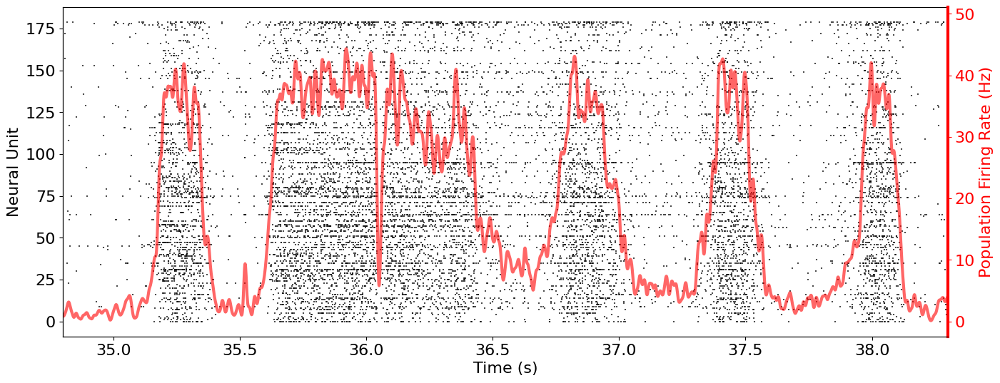

In [5]:
plot_raster(sd, xlim=(34.8,38.3), smoothness=5)

(<Axes: xlabel='Time (s)', ylabel='Neural Unit'>,
 <Axes: xlabel='Time (ms)', ylabel='Population Firing Rate (Hz)'>)

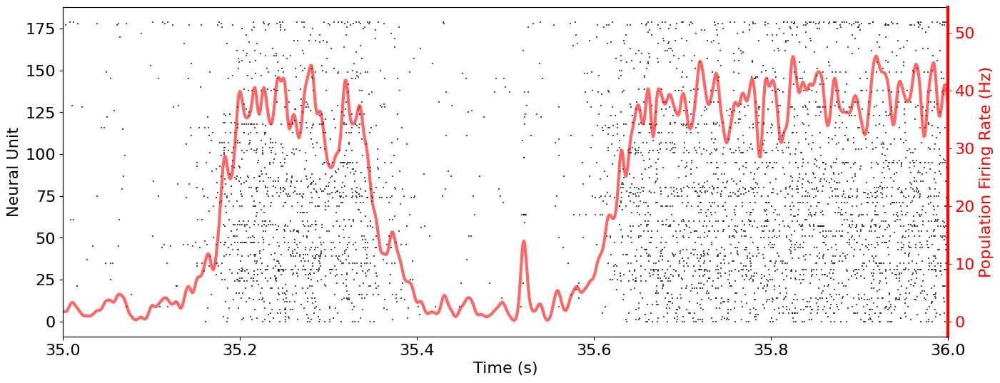

In [6]:
plot_raster(sd, xlim=(35,36), smoothness=3)

### Initiation theta peaks
#plt.vlines(35.14, 0, 100, color='blue')
#plt.vlines(35.215, 0, 100, color='blue')
### Seizure theta peaks
#plt.vlines(35.545, 0, 100, color='blue')
#plt.vlines(35.615, 0, 100, color='blue')
#plt.vlines(35.705, 0, 100, color='blue')

In [7]:
with open("/workspaces/human_hippocampus/data/ephys_raw/2023-12-11-e-Hc120523_aav9hckcr1_chip21769/acid1_start25s_stop39s_fs1ms.pkl", 'rb') as filename:
    data_raw = pickle.load(filename)
print(data_raw.keys())
print(data_raw["data"].shape)
xy = data_raw["xy"]

dict_keys(['data', 'xy', 'frame_rate', 'uuid', 'file'])
(894, 14000)


(1000.0, 3200.0)

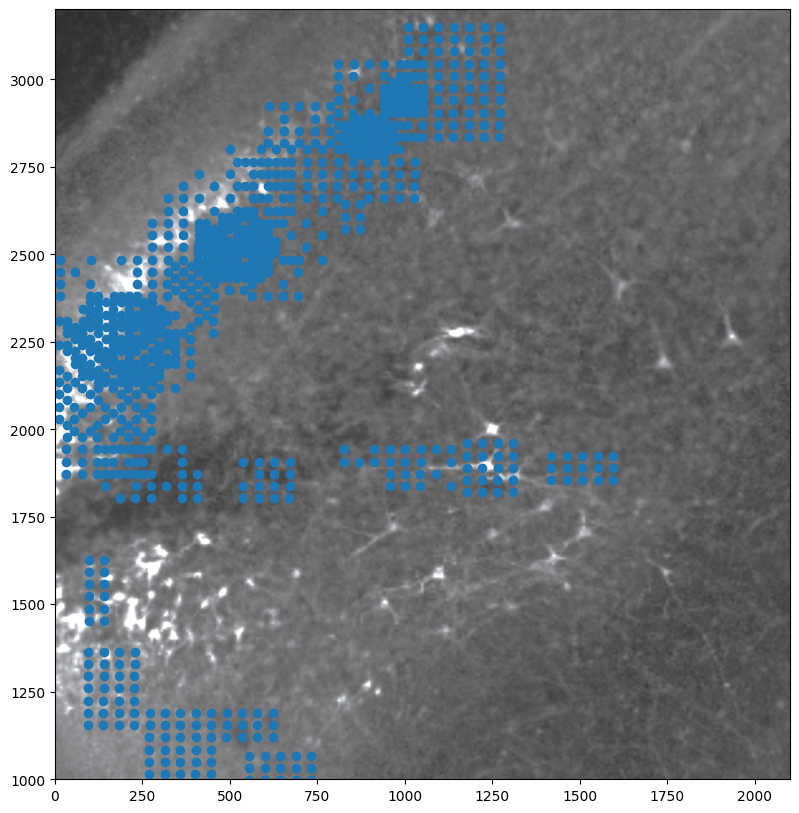

In [8]:
plt.figure(figsize=(15,10))
img = plt.imread("/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png") 
plt.imshow(img,  extent=[0, 2100, 0, 3850])
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy_small[ xy_small[:,1]>1750 , :]
plt.scatter( xy[:,0]/10,  xy[:,1] ) 
plt.ylim(1000,3200)

(1000.0, 3200.0)

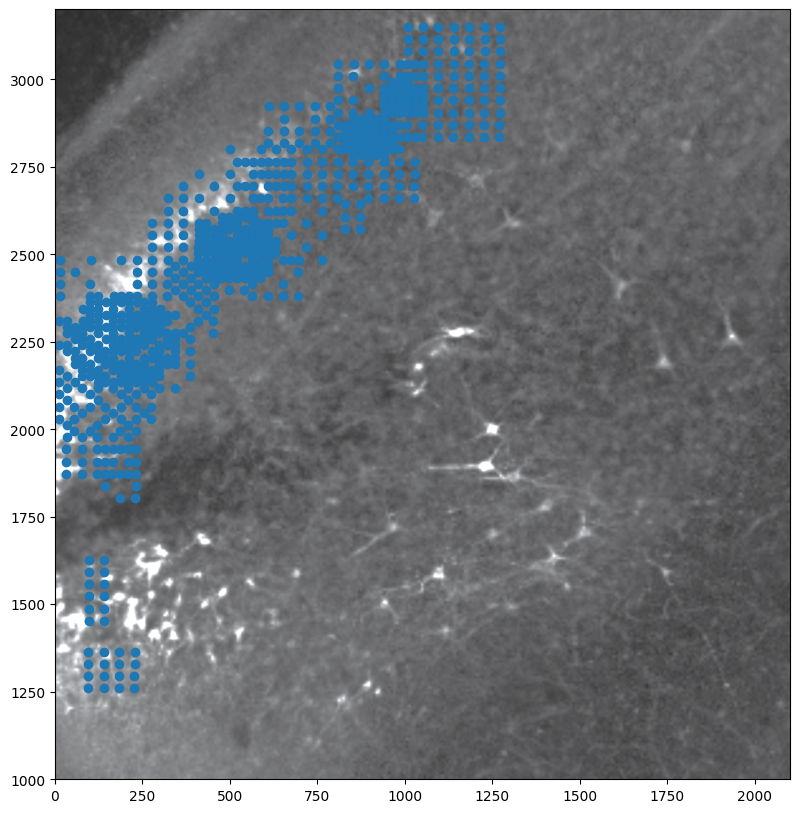

In [9]:
plt.figure(figsize=(15,10))
img = plt.imread("/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png") 
plt.imshow(img,  extent=[0, 2100, 0, 3850])
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy_small[ xy_small[:,1]>1250 , :]
plt.scatter( xy_small[:,0]/10,  xy_small[:,1] ) 
plt.ylim(1000,3200)


# Initiation Video

In [20]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start25s_range_9800_10800_5.mp4'
movie_range_ms= range(9800,10800,5)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 25
xlim = (34.8,36)

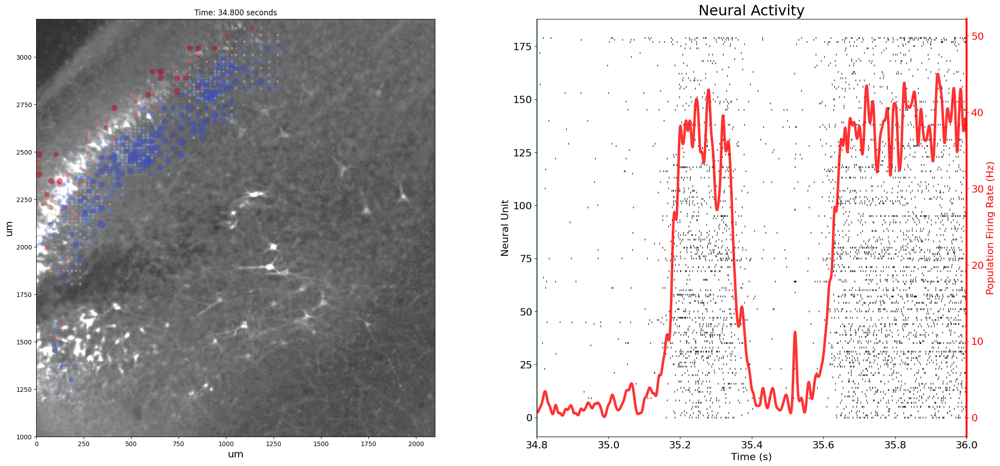

In [21]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
num_spikes = sd.binned(bin_size=1)
smoothed_spikes = gaussian_filter1d( num_spikes.astype(float), sigma=4)
pop_fr = smoothed_spikes * 1000 / sd.N
bins = np.linspace(0, sd.length, num_spikes.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=5, alpha=0.6)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=4, alpha=0.8)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )

# <font color="red">Old  Initiation Video

In [14]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start25s_range_9800_10800_5.mp4'
movie_range_ms= range(9800,10800,10)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 25
xlim = (34.8,36)

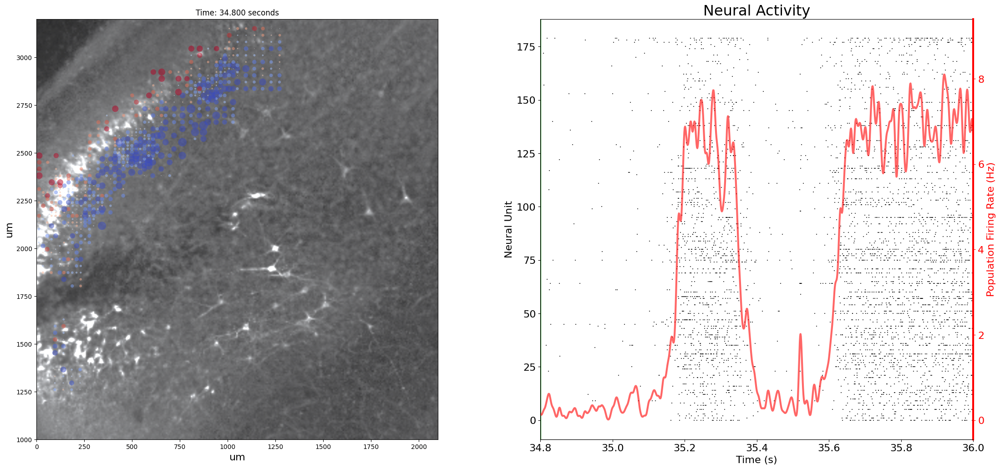

In [30]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
pop_rate = sd.binned(bin_size=1)
pop_fr = gaussian_filter1d(pop_rate.astype(float), sigma=4)
bins = np.linspace(0, sd.length, pop_rate.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=4, alpha=0.7)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=3, alpha=0.6)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )

# <font color="brown"> Check last mega burst

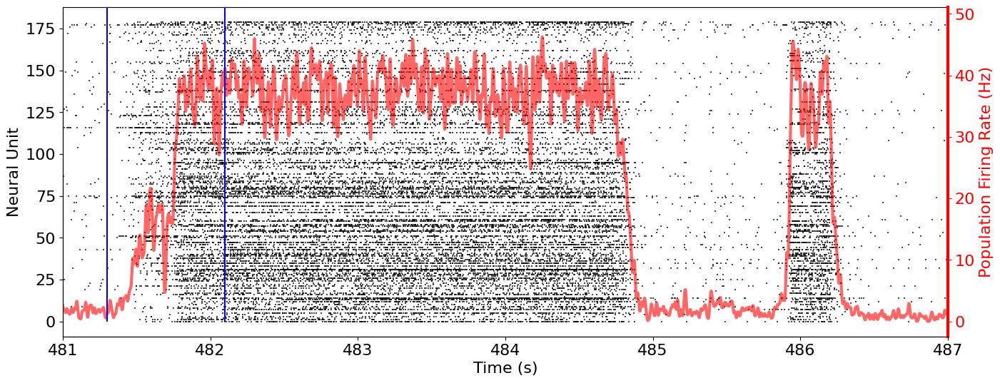

In [21]:
plot_raster(sd, xlim=(481, 487), smoothness=5)

plt.vlines(481.3, 0, 100, color='blue')
plt.vlines(482.1, 0, 100, color='blue')

(<Axes: xlabel='Time (s)', ylabel='Neural Unit'>,
 <Axes: xlabel='Time (ms)', ylabel='Population Firing Rate (Hz)'>)

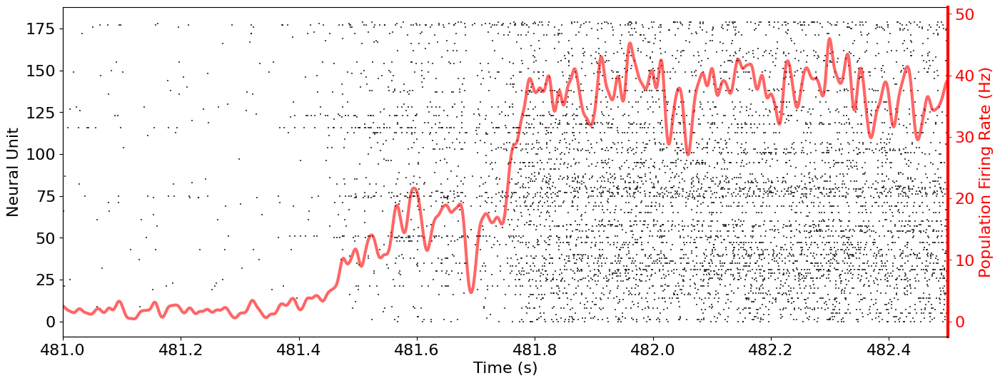

In [23]:
plot_raster(sd, xlim=(481, 482.5), smoothness=5)

In [22]:
with open("/workspaces/human_hippocampus/data/ephys_raw/2023-12-11-e-Hc120523_aav9hckcr1_chip21769/acid1_start481s_stop487s_fs1ms.pkl", 'rb') as filename:
    data_raw = pickle.load(filename)
print(data_raw.keys())
print(data_raw["data"].shape)
xy = data_raw["xy"]

dict_keys(['data', 'xy', 'frame_rate', 'uuid', 'file'])
(894, 6000)


In [26]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start481s_range_300_1100_5.mp4'
movie_range_ms= range(300,1100,5)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 481
xlim = (481,482.5)

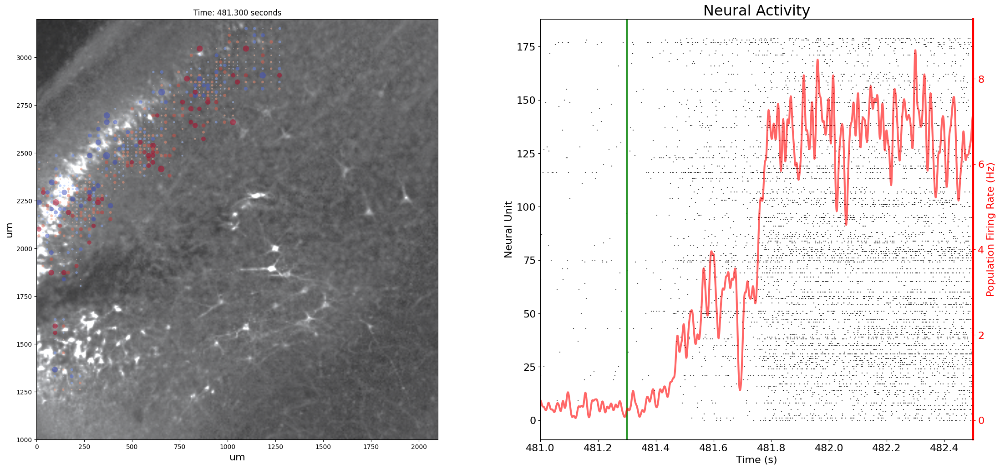

In [27]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
pop_rate = sd.binned(bin_size=1)
pop_fr = gaussian_filter1d(pop_rate.astype(float), sigma=4)
bins = np.linspace(0, sd.length, pop_rate.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=4, alpha=0.7)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=3, alpha=0.6)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )

# Long Video

In [15]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start25s_range_9800_13300_10.mp4'
movie_range_ms= range(9800,13300,10)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 25
xlim = (34.8,38.3)

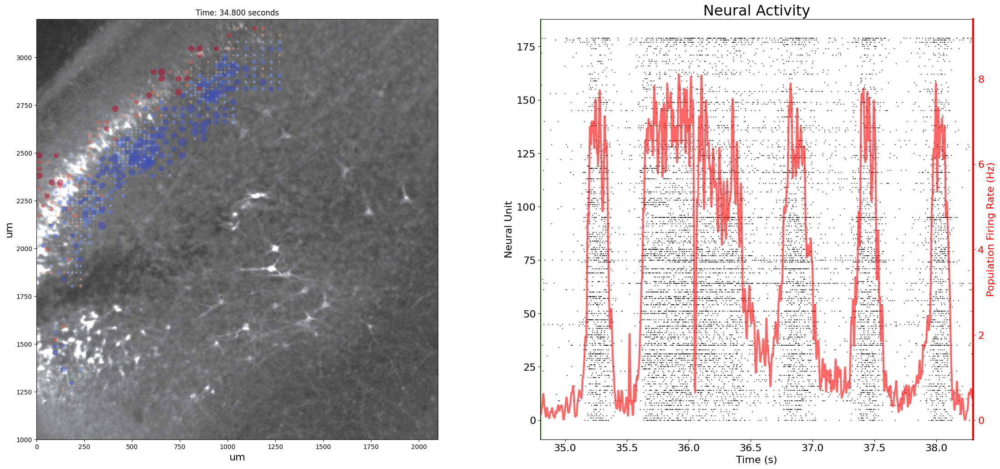

In [16]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
pop_rate = sd.binned(bin_size=1)
pop_fr = gaussian_filter1d(pop_rate.astype(float), sigma=4)
bins = np.linspace(0, sd.length, pop_rate.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=4, alpha=0.7)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=3, alpha=0.6)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )

# <font color="brown"> Baseline

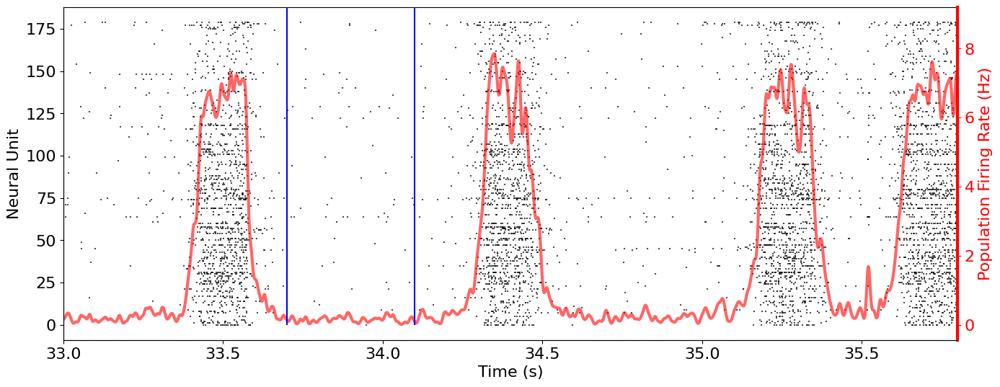

In [19]:
plot_raster(sd, xlim=(33,35.8), smoothness=5)

plt.vlines(33.7, 0, 100, color='blue' )
plt.vlines(34.1, 0, 100, color='blue' )

In [20]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start25s_range_8700_9100_10.mp4'
movie_range_ms= range(8700,9100,10)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 25
xlim = (33.7,34.1)

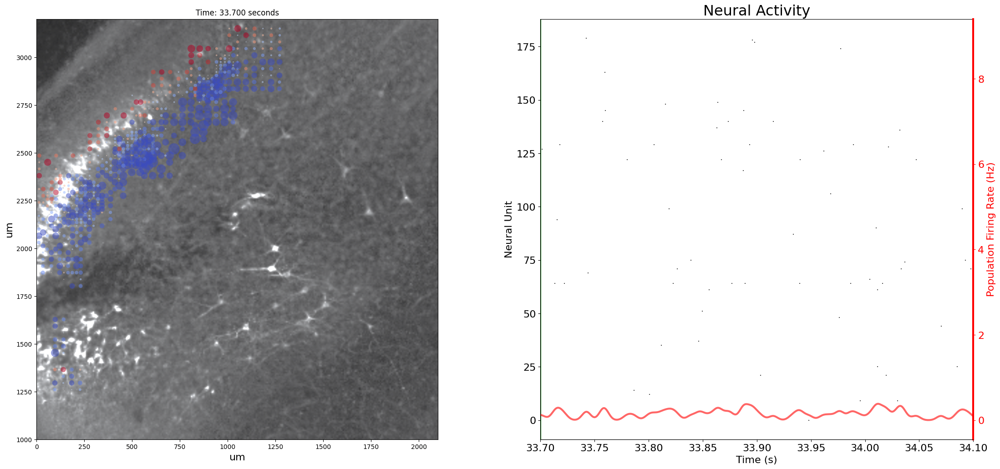

In [21]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
pop_rate = sd.binned(bin_size=1)
pop_fr = gaussian_filter1d(pop_rate.astype(float), sigma=4)
bins = np.linspace(0, sd.length, pop_rate.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=4, alpha=0.7)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=3, alpha=0.6)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )

# <font color="brown"> Initiation

In [22]:
35.09

35.09

In [23]:
35.27

35.27

In [24]:
raw_dict = data_raw
wave_type= "theta"
#movie_range_ms= range(10000,12000,5)
filename='chip21769_acid_theta_raster_start25s_range_10090_10270_10.mp4'
movie_range_ms= range(10090,10270,10)
#filename='chip21769_acid_theta_raster_start25s_range_10000_12000_5.mp4'
image_path = "/workspaces/human_hippocampus/data/histology/chip21769_bw_rotated.png"

frame_interval_ms=100
size_exp=1.5
size_scale=25
start_s = 25
xlim = (35.09,35.27)

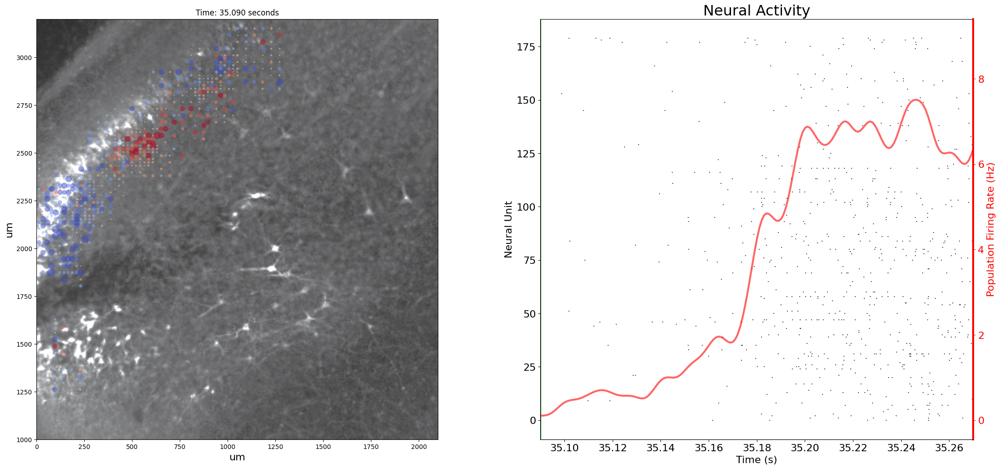

In [25]:
fig, plots = plt.subplots(nrows=1,ncols=2,figsize=(27,12))

### Code for Theta Plot ###
data = get_brain_waves( raw_dict["data"], raw_dict["frame_rate"] )[wave_type]  # get common brain waves
data = data[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
xy_small = xy[ np.logical_not(np.logical_and( xy[:,1]<2000, xy[:,0]/10>250 ))  , :]
data = data[ xy_small[:,1]>1250 , :] 
xy_small = xy_small[ xy_small[:,1]>1250 , :]

norm = plt.Normalize( vmin= np.mean(data)-np.std(data), vmax= np.mean(data)+np.std(data) )
img = plt.imread(image_path)      # Load in image
plots[0].imshow(img,  extent=[0, 2100, 0, 3850]) # Plot image, have it correspond to electrode dimensions
plot0 = plots[0].scatter( xy_small[:,0]/10, xy_small[:,1] , c=data[:,0] , norm=norm, cmap=cm.coolwarm,
                        s=(np.abs(data[:,0])**size_exp)*size_scale ,  alpha=.5 , edgecolor='none' )
#plots[0].set_xlim(0,1750)
plots[0].set_ylim(1000,3200)
plots[0].set_xlabel('um', fontsize=16)                                         # add axises and title
plots[0].set_ylabel('um', fontsize=16)

### Code for Raster ###
# Get firing rate
pop_rate = sd.binned(bin_size=1)
pop_fr = gaussian_filter1d(pop_rate.astype(float), sigma=4)
bins = np.linspace(0, sd.length, pop_rate.shape[0] ) #/1000
plots[1].set_title("Neural Activity", fontsize=23)
y = 0
for vv in sd.train:
    plots[1].scatter(vv/1000, [y]*len(vv), marker="|", c='k', s=4, alpha=0.7)
    y += 1
plots[1].set_xlabel("Time (s)", fontsize=16)
plots[1].set_ylabel("Neural Unit", fontsize=16)
plots[1].xaxis.set_tick_params(labelsize=16)
plots[1].yaxis.set_tick_params(labelsize=16)

axs1 = plots[1].twinx()
axs1.yaxis.set_label_position("right") 
axs1.spines['right'].set_color('r')
axs1.spines['right'].set_linewidth(3)
axs1.plot(bins/1000, pop_fr, color='r', linewidth=3, alpha=0.6)
axs1.set_ylabel("Population Firing Rate (Hz)", fontsize=16, color='r')
axs1.set_xlabel("Time (ms)", fontsize=16)
axs1.yaxis.set_tick_params(labelsize=16)
axs1.set_xlim( xlim )
#axs1.set_ylim(ylim)
axs1.spines['top'].set_visible(False)
axs1.get_xaxis().set_visible(False)
axs1.tick_params(left=False, right=True, labelleft=False, labelright=True,
                bottom=False, labelbottom=True)
axs1.tick_params(axis='y', colors='r')
vl = plots[1].axvline(x=10, color='green', linewidth=2, linestyle='-')
 

### Code for Heatmap ###


# animation function.  This is called sequentially
def animate(i):
    # Wave plot
    plot0.set_array(data[:,i])
    plot0._sizes = (np.abs(data[:,i])**size_exp)*size_scale
    plots[0].set_title(f"Time: {start_s+i/1000:.3f} seconds")
    #plots[0].set_title("")
    #plots[0].text(0.5, 1.03, "Theta waves", ha='center', va='bottom', fontsize=23, transform=plots[0].transAxes)
    #t = start_s + i / 1000
    #plots[0].text(0.5, 1.024, f"{start_s+i/1000:.3f} seconds", ha='center', va='top', fontsize=17, transform=plots[0].transAxes)

    # Raster Plot
    t = start_s + i/1000
    vl.set_xdata([t,t])
    return plots

anim = FuncAnimation(fig, animate, frames=movie_range_ms, interval=100, blit=False)  
anim.save( filename )